# **Image Processing**

## **Numpy and Image Basics**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline

In [ ]:
import os

In [ ]:
os.getcwd()

'/content'

In [ ]:
os.chdir("/content/")

In [ ]:
!ls

puppy.png  sample_data


In [ ]:
!pwd

/content


In [ ]:
!ls

puppy.png  sample_data


In [ ]:
pic=Image.open("puppy.png")

In [ ]:
#pic

In [ ]:
type(pic)

PIL.PngImagePlugin.PngImageFile

In [ ]:
## convert it as array

pic_array=np.asarray(pic)
# pic_array

pic_array.shape

(1024, 1024, 4)

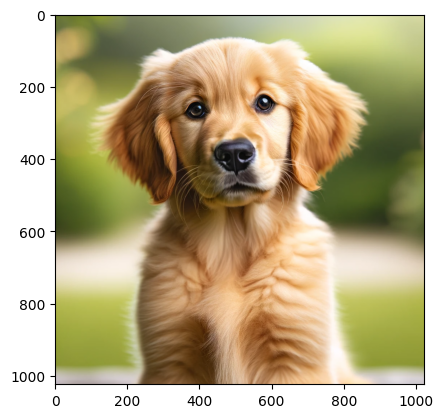

In [ ]:
plt.imshow(pic_array)

In [ ]:
pic_c=pic_array.copy()

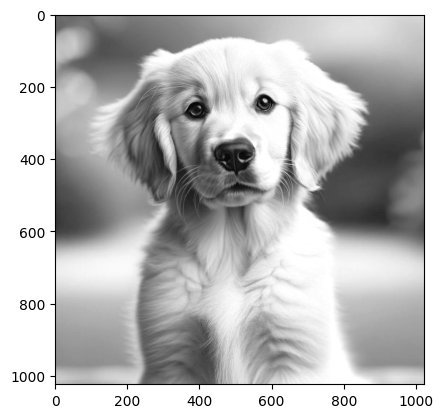

In [ ]:
plt.imshow(pic_c[:,:,0], cmap="gray")
#cmap parameter specifies the colormap to be used for displaying the image.
# By setting it to "gray", the image will be shown in grayscale.

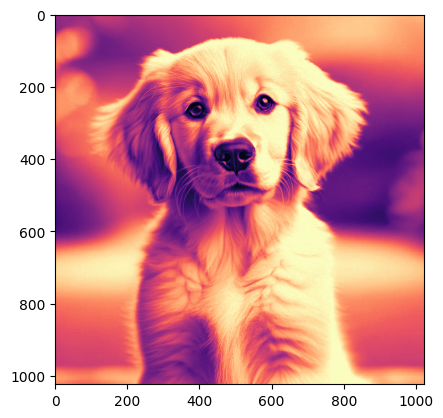

In [ ]:
plt.imshow(pic_c[:,:,0], cmap="magma")

#### Perceptually Uniform Sequential:
#These colormaps are designed to be perceptually uniform, even in black-and-white print
#'viridis'
#'plasma'
#'inferno'
#'magma'
#'cividis'

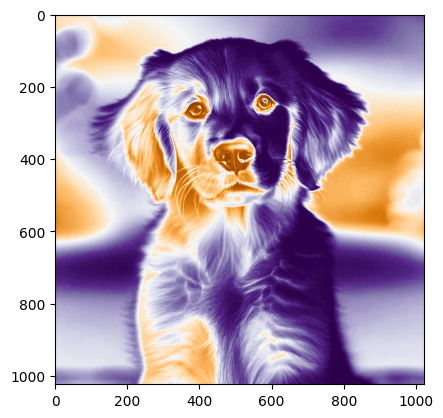

In [ ]:
###### Diverging:
#These are used for data where both the low and high values are interesting.
# They have a distinct color at each end, which transitions to a neutral color in the middle.

#'PiYG'
#'PRGn'
#'BrBG'
#'PuOr'
#'RdBu'
plt.imshow(pic_c[:,:,0], cmap='PuOr')

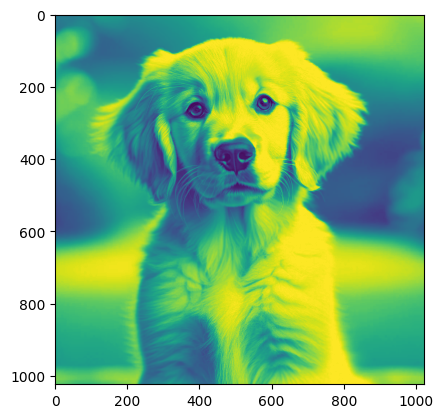

In [ ]:
plt.imshow(pic_c[:,:,0])


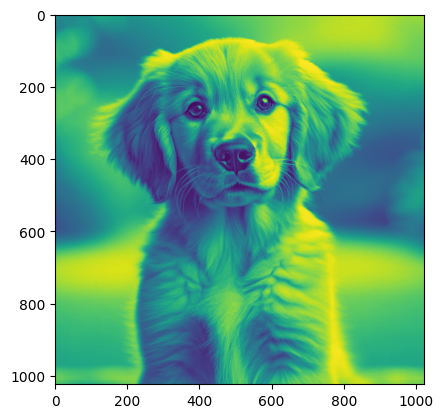

In [ ]:
plt.imshow(pic_c[:,:,1]) #cmap="gray"


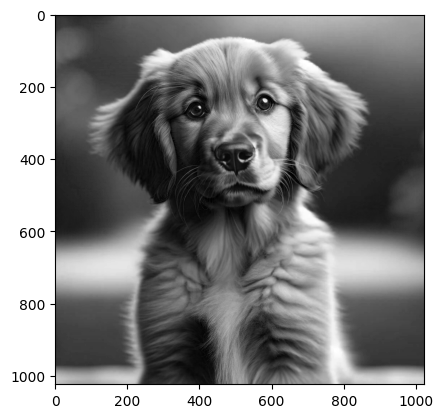

In [ ]:
plt.imshow(pic_c[:,:,2], cmap="gray")

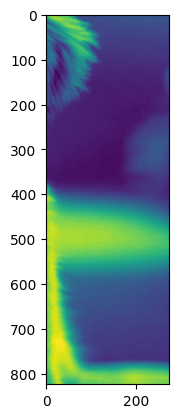

In [ ]:
plt.imshow(pic_c[200:1200,750:1600,2])

In [ ]:
## Green channel
pic_c[:,:,1]=0

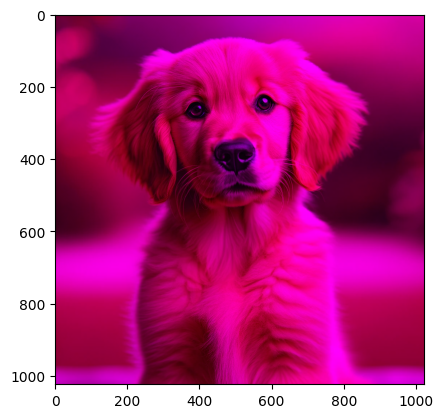

In [ ]:
plt.imshow(pic_c) # green is zero and only color left is red and blue that make purple

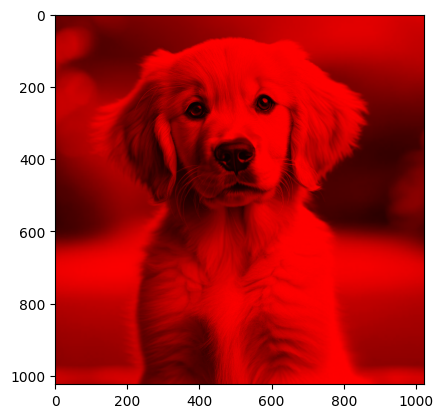

In [ ]:
## Blue channel
pic_c[:,:,2]=0 # we get read of blue
plt.imshow(pic_c)



---



---



---



---



####  **Step 1: Basic Image Loading and Visualization**

Before diving into preprocessing, it's crucial to know how to load and display images.

In [ ]:
import cv2

In [ ]:
# Load an image
img=cv2.imread("puppy.png")

In [ ]:
img.shape

(1024, 1024, 3)

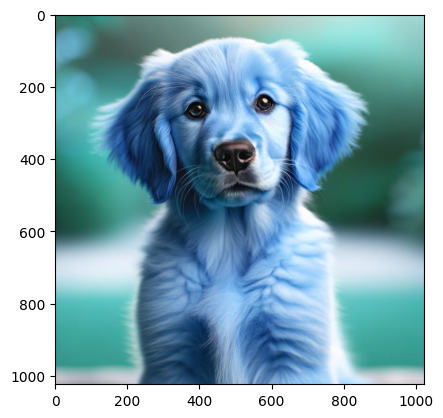

In [ ]:
plt.imshow(img)

In [ ]:
### In matplotlib -------->>>>>> RGB: RED, GREEN , BLUE

# OPENCV -------->>>>>> BGR: BLUE, GREEN,  RED

## **Step 2: Basic Operations**

### **1. Grayscale Conversion**
Converting an image to grayscale simplifies the image by reducing its color channels, which is often the first step in preprocessing.

In [ ]:
# Convert image to RGB (OpenCV loads images in BGR)

fixed_img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

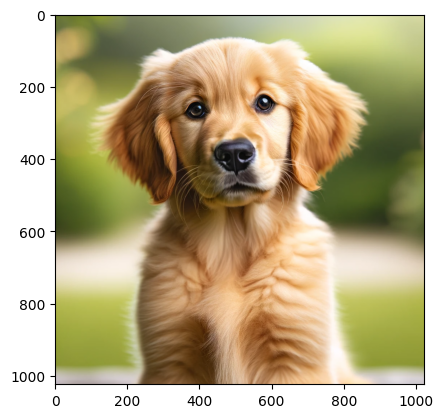

In [ ]:
# Display the image
plt.imshow(fixed_img)
plt.show()

In [ ]:
### read the file as grayscale
img_gray=cv2.imread("puppy.png", cv2.IMREAD_GRAYSCALE)

In [ ]:
img_gray.shape

(1024, 1024)

In [ ]:
img_gray.min()

0

In [ ]:
img_gray.max()

255

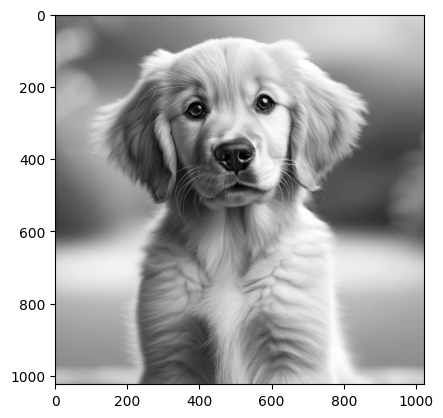

In [ ]:
plt.imshow(img_gray, cmap='gray')

## **2.Resizing**

Resizing images to a common size is often necessary, especially in machine learning models.

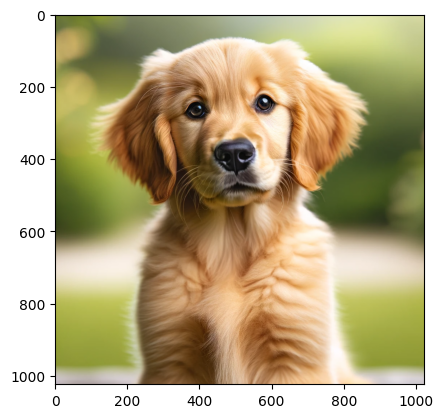

In [ ]:
plt.imshow(fixed_img)

In [ ]:
new_image=cv2.resize(fixed_img, (600,600)) # do it though the three channels, # Resize to 600*600

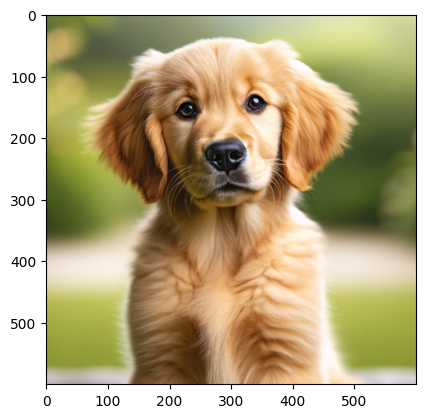

In [ ]:
plt.imshow(new_image)

In [ ]:
new_image2=cv2.resize(fixed_img, (20,20))

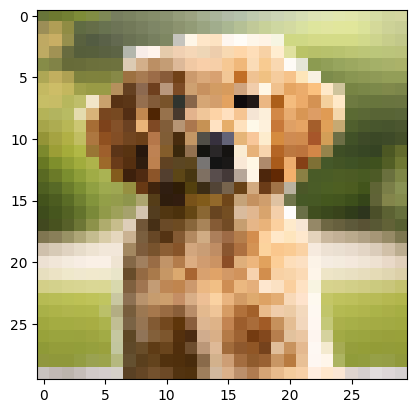

In [ ]:
plt.imshow(new_image2)

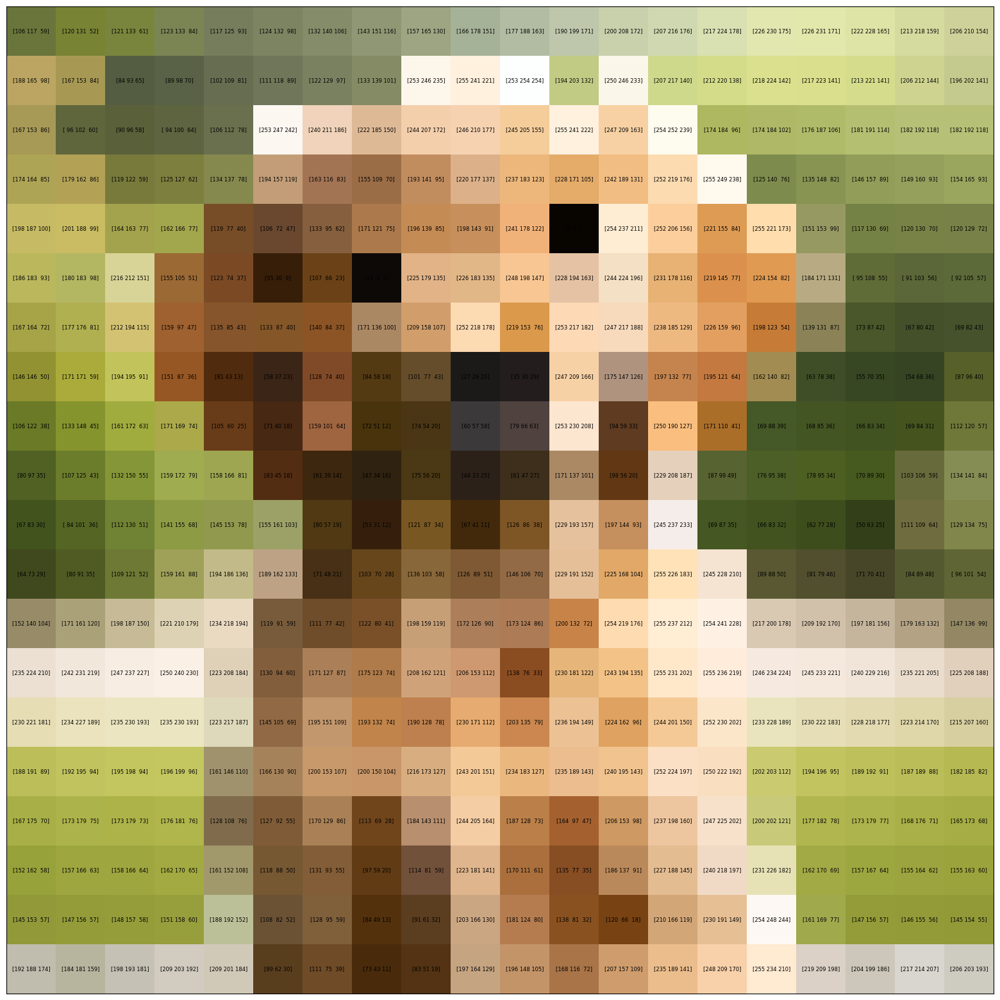

In [ ]:

# Create a plot large enough to display the pixel values clearly
plt.figure(figsize=(20, 20))

# Use imshow to display the image
plt.imshow(new_image2, cmap='gray')

# Loop over the data dimensions and create text annotations with smaller font size
for i in range(new_image2.shape[0]):
    for j in range(new_image2.shape[1]):
        text = plt.text(j, i, new_image2[i, j],
                       ha="center", va="center", color="black", fontsize=6)  # Adjusted fontsize here

plt.xticks([])
plt.yticks([])
plt.show()

### **Lets resize it by ratio**

In [ ]:
w_ratio=0.1 # Try diffenert numbers, height and weight ration reduce by 90%
l_ratio=0.1 # 10% of original image

# here we want to reduce the image size by 50%

In [ ]:
n_img=cv2.resize(fixed_img,(0,0), fixed_img, w_ratio,l_ratio)

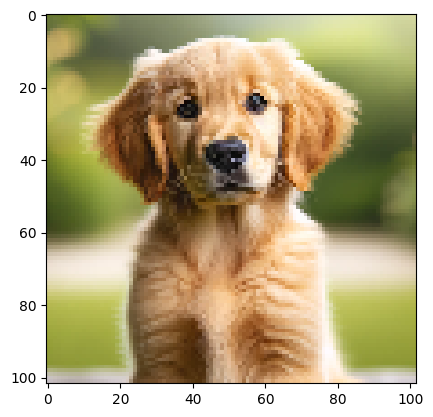

In [ ]:
plt.imshow(n_img)

### **Flipping the image**

In [ ]:
f_img=cv2.flip(fixed_img,0) # flip along x axis. Try, 0, 1, -1

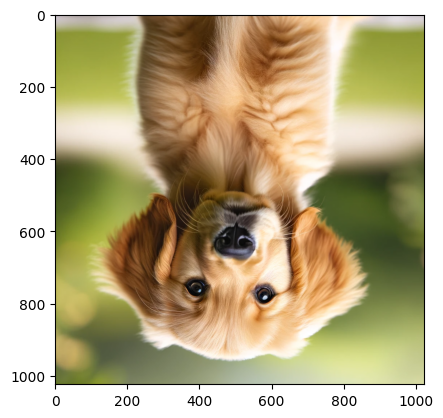

In [ ]:
plt.imshow(f_img)

In [ ]:
type(f_img)

numpy.ndarray

### **Step 3: Basic Image Enhancements**

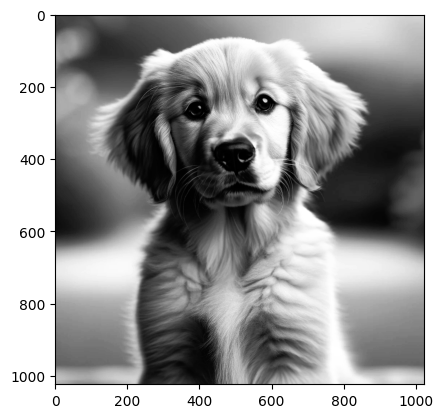

In [ ]:
# Apply histogram equalization to the grayscale image

img_gray=cv2.imread("puppy.png", cv2.IMREAD_GRAYSCALE)
equalized_image = cv2.equalizeHist(img_gray)

# Display the result
plt.imshow(equalized_image, cmap='gray')
plt.show()


### **Step 4: Noise Reduction**

#### **Gaussian Blur**
Applying a Gaussian blur can help reduce noise and detail in an image.

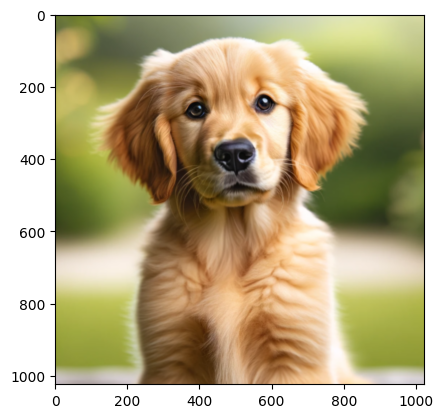

In [ ]:
blurred_image = cv2.GaussianBlur(fixed_img, (5, 5), 0)

# Display the blurred image
plt.imshow(blurred_image)
plt.show()


### Save it as new image

In [ ]:
cv2.imwrite("NewDog.jpg", fixed_img)

True

### **Step 5. Image Thresholding**

In [ ]:
!ls

brick.png  cat.png  crossword.png  NewDog.jpg  puppy.png  rainbow.png  sample_data


In [ ]:
img = cv2.imread('rainbow.png')

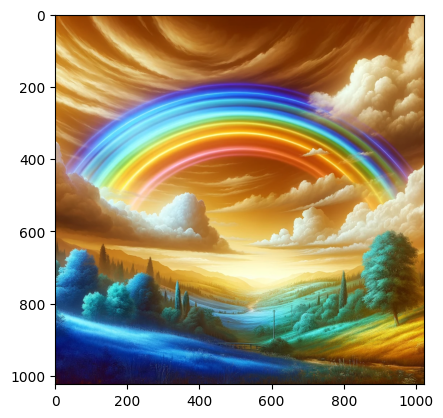

In [ ]:
plt.imshow(img)

In [ ]:
# Adding the 0 flag to read it in black and white
img = cv2.imread('rainbow.png',0)

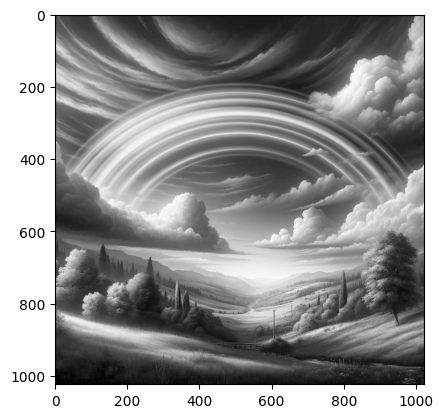

In [ ]:
plt.imshow(img,cmap='gray')

### **Different Threshold Types**

### 1. Binary

In [ ]:
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)

In [ ]:
ret

127.0

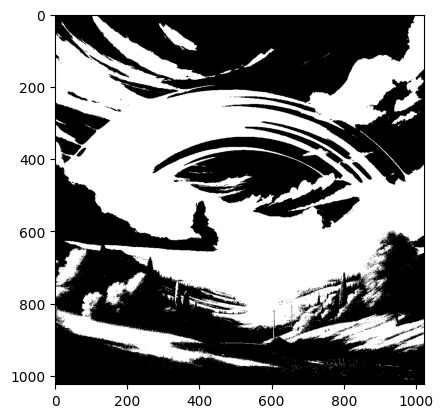

In [ ]:
plt.imshow(thresh1,cmap='gray')

### 2. Binary Inverse

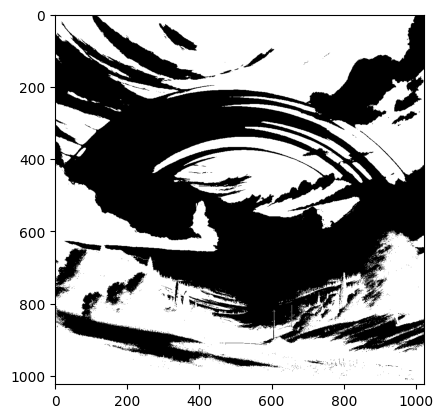

In [ ]:
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
plt.imshow(thresh2,cmap='gray')

### **Threshold to Zero**

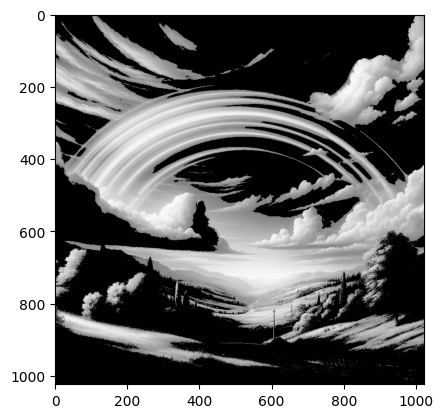

In [ ]:
ret,thresh4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)
plt.imshow(thresh4,cmap='gray')

## **Step 6. Blurring and Smoothing**



In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
def load_img():
    img = cv2.imread('brick.png').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [ ]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

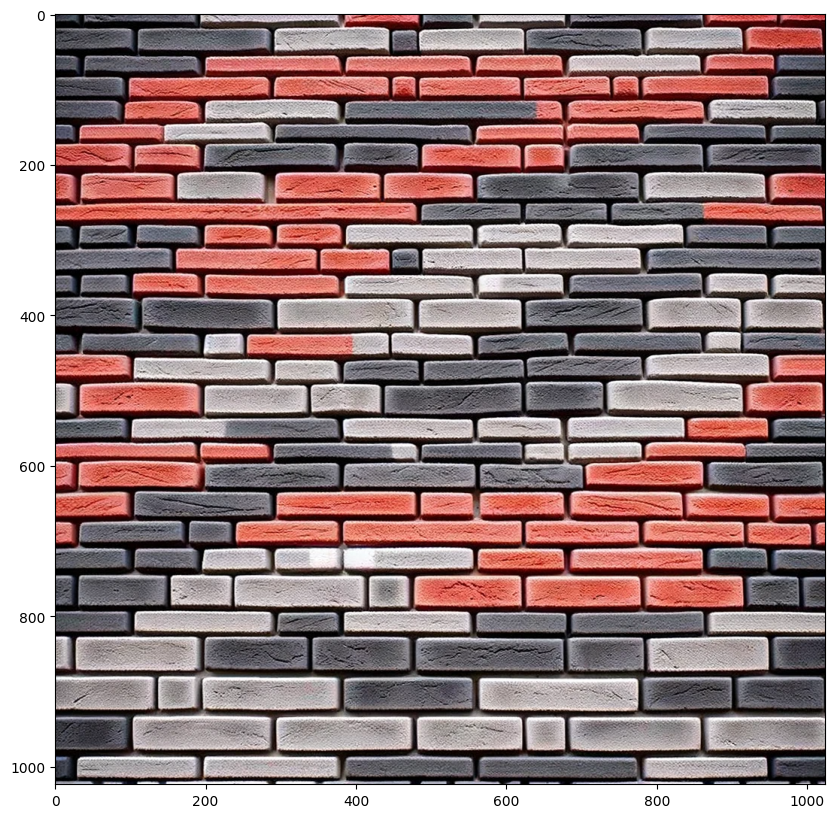

In [ ]:
i = load_img()
display_img(i)

### **Gamma Correction : Practical Effect of Increasing Brightness**

The gamma value is set to
1
/
4
1/4 or 0.25. This value controls the degree of gamma correction applied to the image. A gamma value of less than 1 darkens the image, while a gamma value greater than 1 brightens it. The specific value of
1
/
4
1/4 indicates that the gamma correction applied will significantly brighten the darker areas of the image more than the brighter areas, attempting to bring details out of the

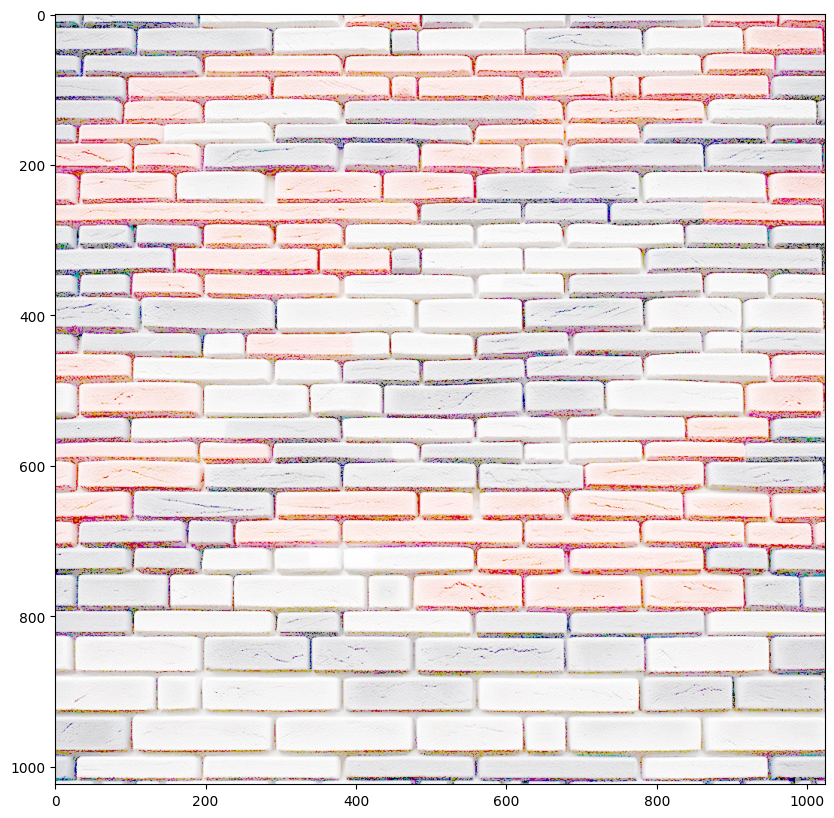

In [ ]:
img = load_img()
gamma = 0.1 #less than 1 make it bright, and more than 1 make it darker
effected_image = np.power(img, gamma)
display_img(effected_image)


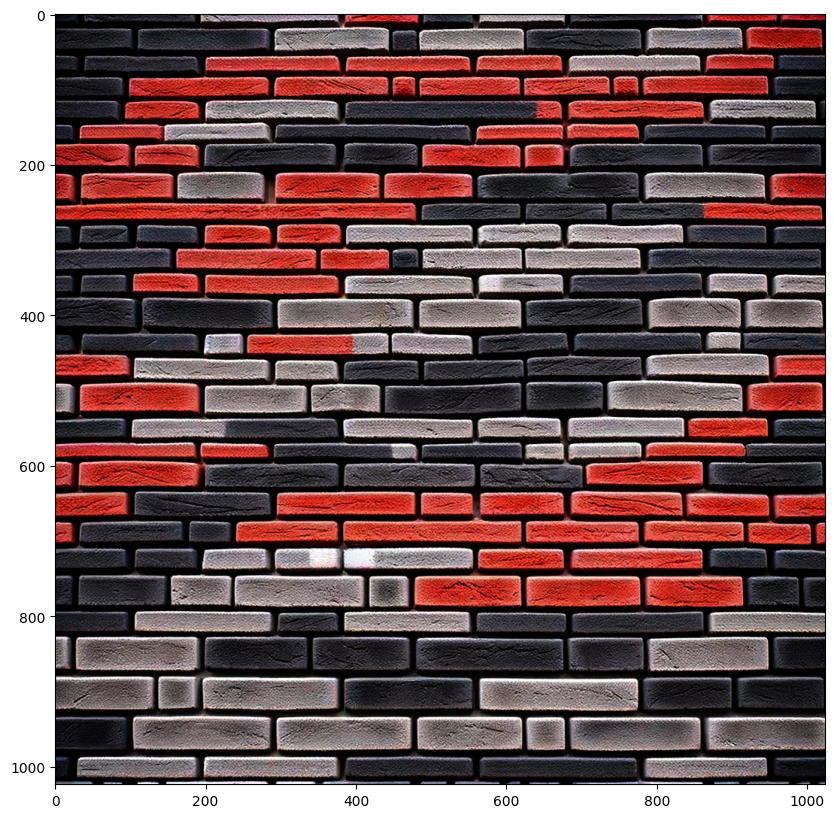

In [ ]:
## using different gamma
img = load_img()
gamma = 2
effected_image = np.power(img, gamma)
display_img(effected_image)



---



---



### **Step 7: Edge Detection**
Canny Edge Detection
Edge detection is useful for finding the boundaries of objects within an image.

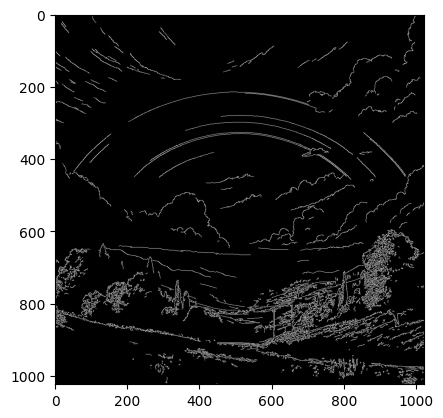

In [ ]:
# Adding the 0 flag to read it in black and white
img = cv2.imread('rainbow.png',0)
edges = cv2.Canny(img, 100, 200)

# Display the edges
plt.imshow(edges, cmap='gray')
plt.show()




---



---



###**Step 8: Edge Preservation Filtering**
Preserving edges while reducing noise can be critical for maintaining the quality of features in an image.

In [ ]:
cat = cv2.imread('cat.png')

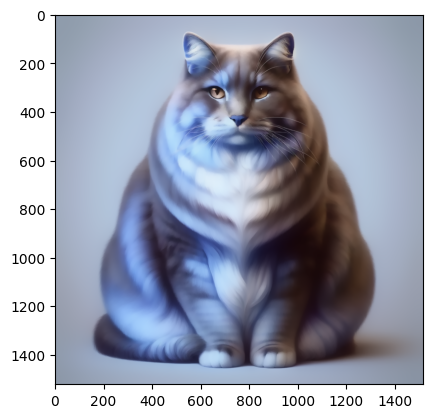

In [ ]:
### Apply edge-preserving filter
epf_image = cv2.edgePreservingFilter(cat, flags=1, sigma_s=60, sigma_r=0.4)

### Display the result
plt.imshow(epf_image)
plt.show()




---



---



#### **Step 9: Feature Extraction**
Extracting features from images, like corners or keypoints, is more advanced and useful for various applications.

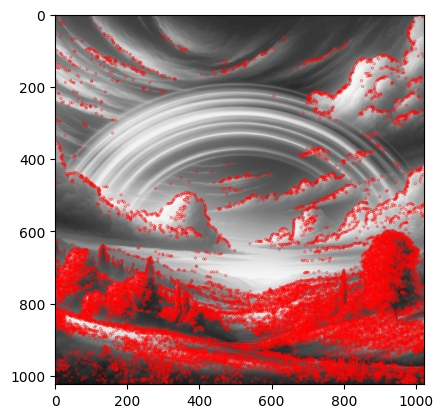

In [ ]:
# FAST feature detector
fast = cv2.FastFeatureDetector_create()

# Detect keypoints
keypoints = fast.detect(img, None)

# Draw keypoints on the image
img_with_keypoints = cv2.drawKeypoints(img, keypoints, None, color=(255,0,0))

# Display the image with keypoints
plt.imshow(img_with_keypoints)
plt.show()


# **Gradients**


In [ ]:
img = cv2.imread('cat.png',0)

In [ ]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')

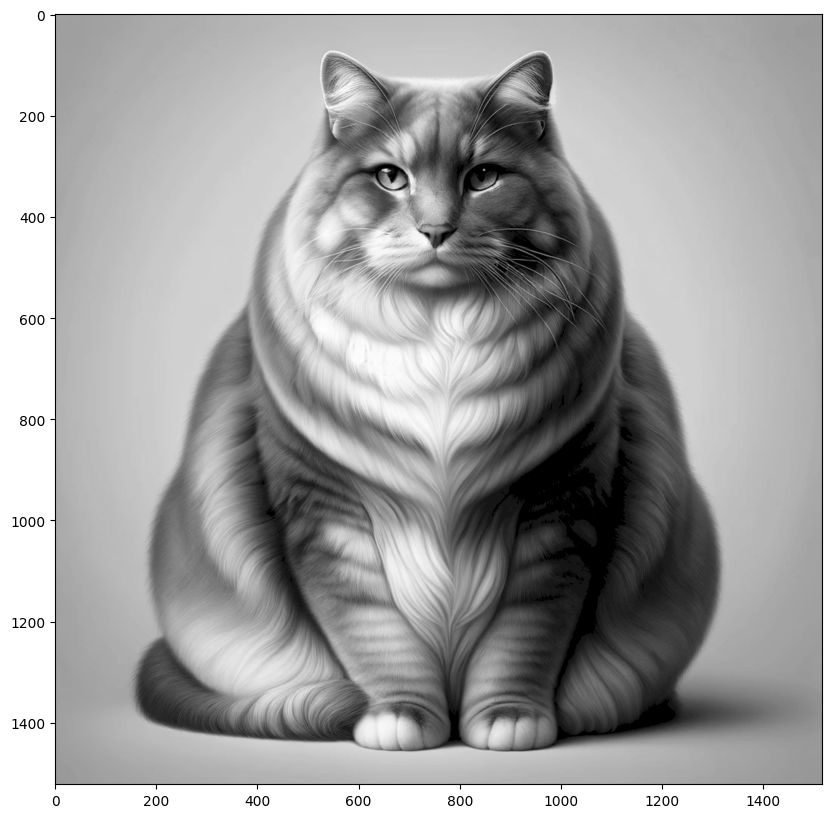

In [ ]:
display_img(img)

In [ ]:
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)
laplacian = cv2.Laplacian(img,cv2.CV_64F)

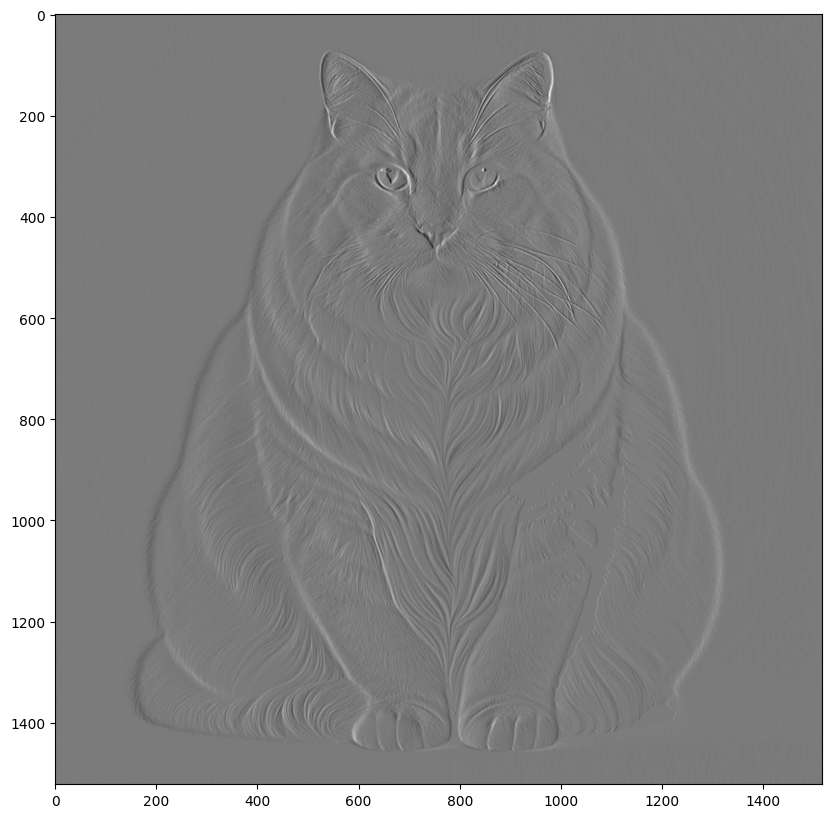

In [ ]:
display_img(sobelx)

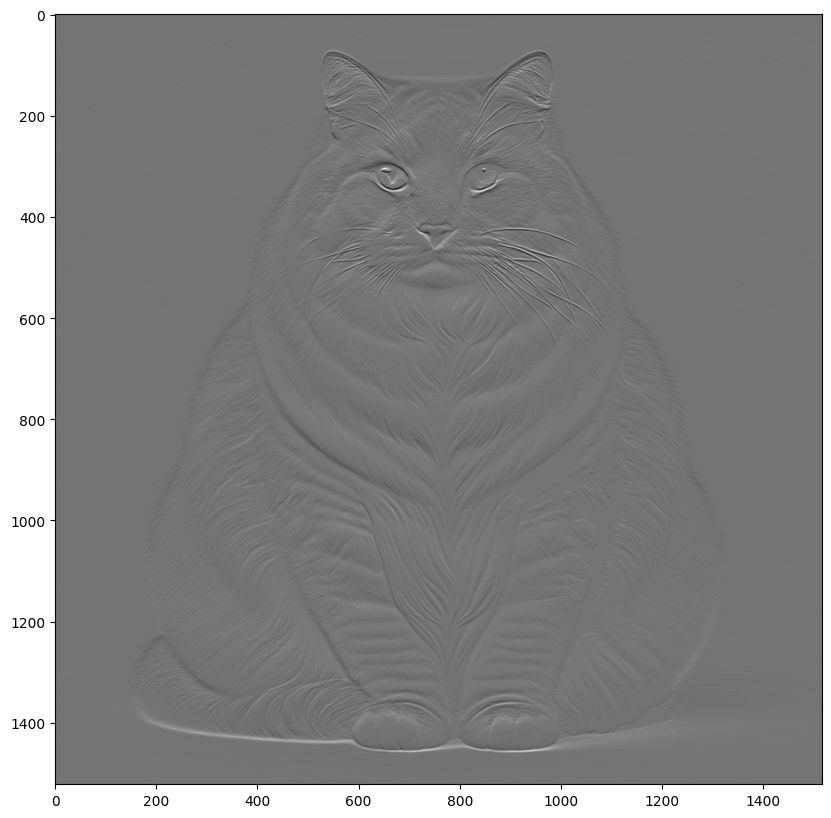

In [ ]:
display_img(sobely)

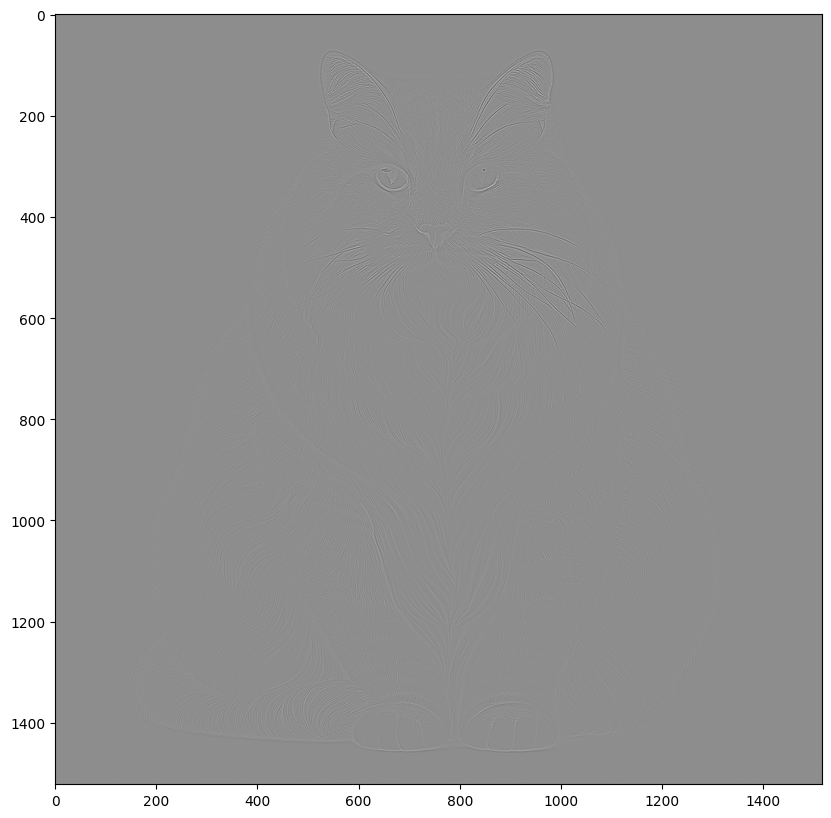

In [ ]:
display_img(laplacian)